In [1]:
from envs.test_env import Electric_Car
from models.baseline import BaselineModel
import matplotlib.pyplot as plt
import numpy as np

In [2]:
env = Electric_Car('data/train.xlsx')
model = BaselineModel(env)
model.train()

24.31
price:  24.31 action =  0 12.99 59.94099999999998
price:  24.31 action =  0
24.31
price:  24.31 action =  0 12.99 59.94099999999998
price:  24.31 action =  0
21.71
price:  21.71 action =  0 12.99 59.94099999999998
price:  21.71 action =  0
8.42
price:  8.42 action =  1 12.99 59.94099999999998
price:  8.42 action =  1
0.01
price:  0.01 action =  1 12.99 59.94099999999998
price:  0.01 action =  1
0.01
price:  0.01 action =  1 12.99 59.94099999999998
price:  0.01 action =  1
0.02
price:  0.02 action =  1 12.99 59.94099999999998
price:  0.02 action =  1
0.01
price:  0.01 action =  1 12.99 59.94099999999998
price:  0.01 action =  1
0.01
price:  0.01 action =  1 12.99 59.94099999999998
price:  0.01 action =  1
6.31
price:  6.31 action =  1 12.99 59.94099999999998
price:  6.31 action =  1
7.81
price:  7.81 action =  1 12.99 59.94099999999998
price:  7.81 action =  1
9.31
price:  9.31 action =  1 12.99 59.94099999999998
price:  9.31 action =  1
21.7
price:  21.7 action =  0 12.99 59.9409

In [3]:
model.upper_thres

65.0

In [4]:
states, rewards, terminated, truncated, infos, actions = model.learn()

24.31
price:  24.31 action =  0 19.5 65.0
price:  24.31 action =  0
24.31
price:  24.31 action =  0 19.5 65.0
price:  24.31 action =  0
21.71
price:  21.71 action =  0 19.5 65.0
price:  21.71 action =  0
8.42
price:  8.42 action =  1 19.5 65.0
price:  8.42 action =  1
0.01
price:  0.01 action =  1 19.5 65.0
price:  0.01 action =  1
0.01
price:  0.01 action =  1 19.5 65.0
price:  0.01 action =  1
0.02
price:  0.02 action =  1 19.5 65.0
price:  0.02 action =  1
0.01
price:  0.01 action =  1 19.5 65.0
price:  0.01 action =  1
0.01
price:  0.01 action =  1 19.5 65.0
price:  0.01 action =  1
6.31
price:  6.31 action =  1 19.5 65.0
price:  6.31 action =  1
7.81
price:  7.81 action =  1 19.5 65.0
price:  7.81 action =  1
9.31
price:  9.31 action =  1 19.5 65.0
price:  9.31 action =  1
21.7
price:  21.7 action =  0 19.5 65.0
price:  21.7 action =  0
14.01
price:  14.01 action =  1 19.5 65.0
price:  14.01 action =  1
15.0
price:  15.0 action =  1 19.5 65.0
price:  15.0 action =  1
10.0
price:  

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

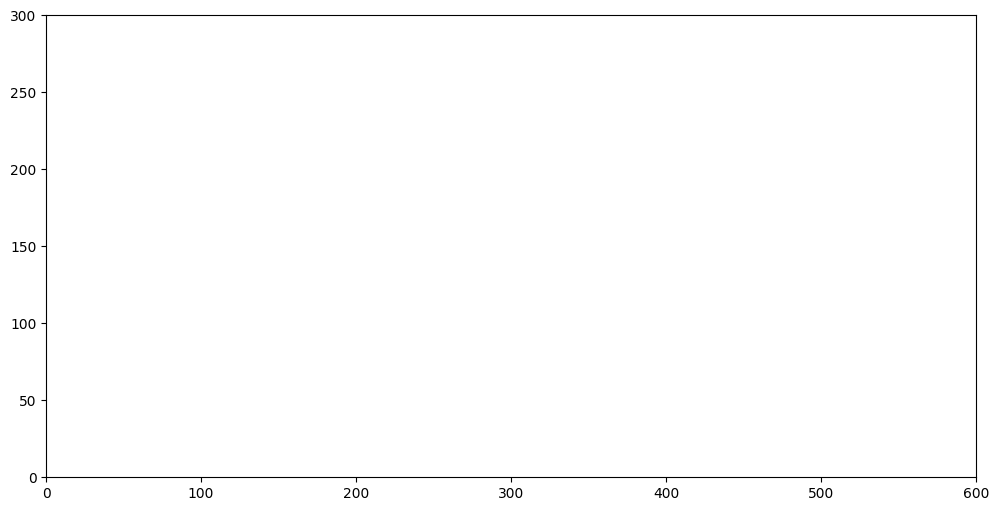

In [17]:
batteries = np.array(states)[:, 0]
prices = np.array(states)[:, 1]
x = range(len(prices))
plt.figure(figsize=(12, 6))
plt.ylim(0, 300)
plt.xlim(0, 600)
col = np.where((np.array(infos)>0) & (np.array(actions)<=0),'salmon', np.where(np.array(infos) > 0, 'red', np.where(np.array(infos)<0, 'green', '#FF000000')))
plt.scatter(x, prices, c = col,s = 30, zorder=1)
plt.plot(x, prices, zorder =0, alpha=0.8)
print('upper = ', model.upper_thres)
upper_line = np.full(shape=len(states), fill_value=model.upper_thres, dtype=np.float64)
lower_line = np.full(shape=len(states), fill_value=model.lower_thres, dtype=np.float64)
plt.plot(x, upper_line, c= "green", alpha=0.5)
plt.plot(x, lower_line, c= "red", alpha=0.5, zorder=1)
plt.ylabel('Price in Euro')
plt.xlabel('Time')
plt.show()

[30. 30. 30. ... 30. 30. 30.]
[24.31 24.31 21.71 ... 29.   24.82 31.28]


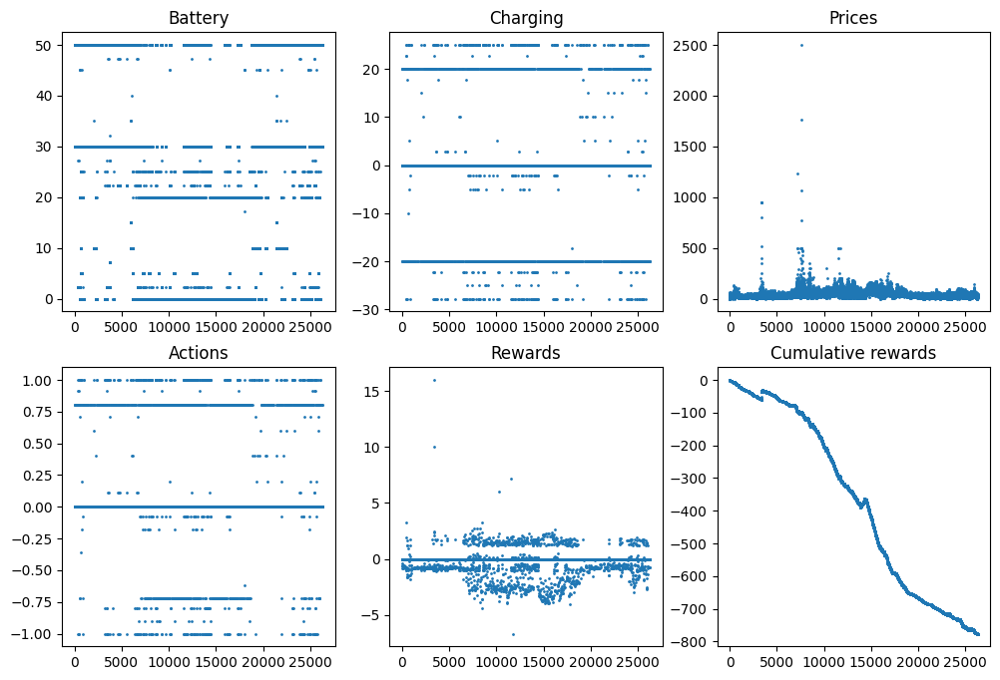

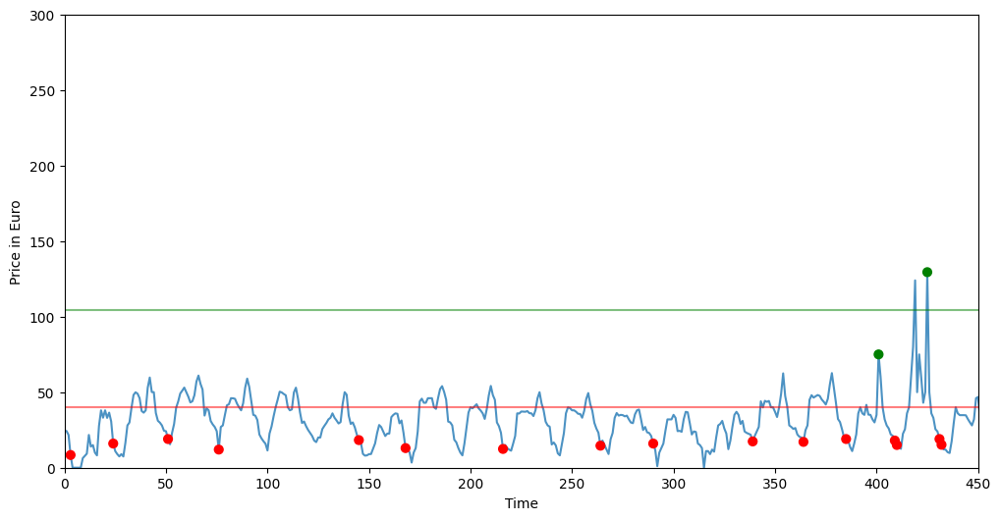

Text(0, 0.5, 'Cumulative Reward in Euro')

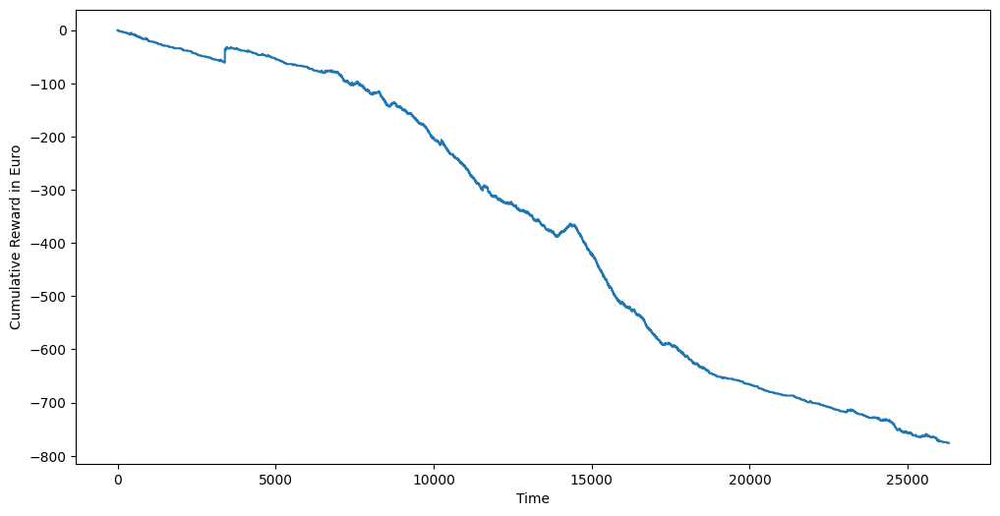

In [6]:
    batteries = np.array(states)[:, 0]
    prices = np.array(states)[:, 1]
    print(batteries)
    print(prices)
    x = range(len(states))
    charging = np.insert(np.diff(batteries), 0, 0)
    cum_rewards = np.cumsum(np.array(rewards))
    
    fig, axis = plt.subplots(2,3, figsize=(12,8))
    for ax, val, name in zip(axis.flat, 
                             [batteries, charging, prices, infos, rewards, cum_rewards],
                               ['Battery', 'Charging', 'Prices', 'Actions', 'Rewards', 'Cumulative rewards']):
        ax.scatter(x, val, s=1)
        ax.set_title(name)
    plt.show()
    
    
    plt.figure(figsize=(12, 6))
    col = np.where(np.array(infos)>0,'red',np.where(np.array(infos)<0, 'green', '#FF000000'))
    plt.ylim(0, 300)
    plt.xlim(0, 450)
    plt.scatter(x, prices, c = col,s = 40, zorder=1)
    plt.plot(x, prices, zorder =0, alpha=0.8)
    upper_line = np.full(shape=len(states), fill_value=104.67949999999989, dtype=np.float64)
    lower_line = np.full(shape=len(states), fill_value=39.99, dtype=np.float64)
    plt.plot(x, upper_line, c= "green", alpha=0.5)
    plt.plot(x, lower_line, c= "red", alpha=0.5, zorder=1)
    plt.ylabel('Price in Euro')
    plt.xlabel('Time')
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(x, cum_rewards)
    plt.xlabel('Time')
    plt.ylabel('Cumulative Reward in Euro')